# ETL

After having explored tha datasets I have ETL pipeline using the folllowing scripts:

 - src/data/read_acs_data.py: this script takes care of the demographic ACS data, taking the following steps:
   - Joins with geolocation data.
   - Set median_year_structure_built to null where lower than 1900.
   - Replace null values in all fields with the average of the adjacent blocks.
   - Replace remaining null values with the column average.
 
 - src/read_ny_data_by_block.py: this script reads the split NYC Taxi dataset one file at a time.
   - First lines where total_amount is negative and trip_distance is zero are discarded.
   - Then the data is joined with the block geolocation.
   - Lines are summarized by number of daily pickups by block
   - Finally the results are merged and the average daily pickups by block are calculated

- src/prepare_final_dataset: this scripts takes the two datasets produced by the previous scripts and joins them. Lines without average pickups data are discarded. This is the fial dataset that will be fed to the model

# Model

To train and test a model I used the src/model/train_test_model script. This script implements the preprocessing, training and testing so I can compare how different algorithms behave.

### Preprocessing

First standard centering and scaling is performed on the variables to improve the interpretability of the coefficients.

### Train and tst sets

Data is split 80/20.

### Searching for hyperparameters

Randomized grid search is used to find the hyperparameters that give the best performance.

### Performance

Some performance metrics are calculated to asses the fit of the tested algorithm:

 - Root Mean Square Error
 - Mean Absolute Error
 - R^2



In [106]:
import pandas as pd
import numpy as np
from sklearn.linear_model import Ridge, Lasso
from sklearn.neighbors import KNeighborsRegressor
import sys
sys.path.append(r'..\src\model')
from train_test_model import train_test_model

df = pd.read_csv(r'..\data\final\final.csv')
num_cols = df.select_dtypes(np.number).drop(columns=['geoid', 'avg']).columns

In [107]:
# %% Ridge Regression
%%time
param_distributions = {'model__alpha': np.logspace(-5, 5, 500)}
model_ridge, prediction = train_test_model(df, Ridge, 'avg', num_cols, param_distributions)

rmse: 9.766181711005428
mae_score: 4.762893436675276
r2_score: 0.4103160771437907
Wall time: 13.5 s


In [108]:
# %% Lasso Regression 
%%time
param_distributions = {'model__alpha': np.logspace(-5, 5, 500)}
model_lasso, prediction = train_test_model(df, Lasso, 'avg', num_cols, param_distributions)


rmse: 9.775081524492863
mae_score: 4.80489955468938
r2_score: 0.4092408425551687
Wall time: 12 s


In [109]:
# %% KNN
%%time
param_distributions = {'model__n_neighbors': np.linspace(1, 100, 500, dtype=int)}
model_knn, prediction = train_test_model(df, KNeighborsRegressor, 'avg', num_cols, param_distributions)

rmse: 9.711972833965168
mae_score: 2.500905537907093
r2_score: 0.4168441937657358
Wall time: 3min 29s


From the results we can see that KNN performs a little better than Ridge and Lasso regressions. We can check which variables are responsible for the most variability in the output by checking the coefficients:

In [110]:
coefs = pd.DataFrame(
    model_ridge.named_steps['model'].coef_,
    columns=['Coefficients'], index=num_cols
).sort_values('Coefficients')
coefs

,Coefficients
commuters_by_public_transportation,-4.964230
married_households,-1.972020
family_households,-1.828017
median_age,-1.279614
female_pop,-1.127911
vacant_housing_units_for_rent,-0.657990
families_with_young_children,-0.593571
white_pop,-0.472020
two_or_more_races_pop,-0.251371
occupied_housing_units,-0.225160


At the beginning of the table we have the variables that where a high value seem to correlate to a lower taxi rides number. The most significant, commuters_by_public_transportation, makes sense because in areas of heavy public transportation traffic such as subways or buses it may be less common to take a taxi.

On the opposite, we have income_per_capita. Probably people with a high income are more likely to take a taxi instead of using public transportation.

<AxesSubplot:title={'center':'Commuting'}>

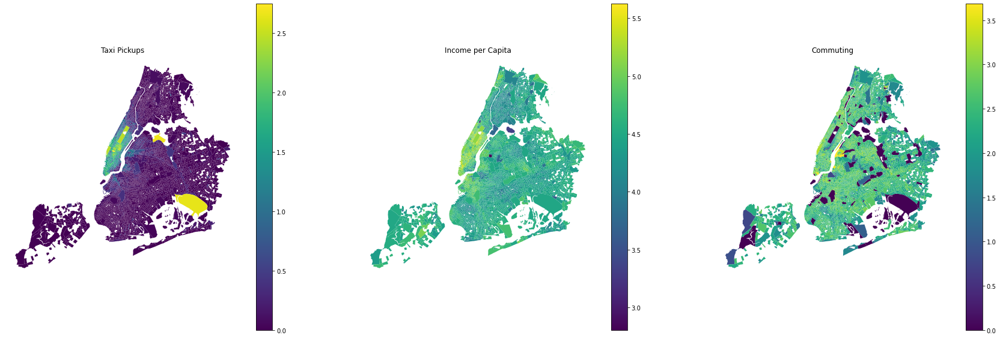

In [111]:
import geopandas
gdf = geopandas.read_feather(r'..\data\final\final.feather')
gdf['avg_plot'] = np.log10(gdf['avg'])
gdf['income_plot'] = np.log10(gdf['income_per_capita'])
gdf['commuting_plot'] = np.log10(gdf['commuters_by_public_transportation'] + 1)
import matplotlib.pyplot as plt
fig, axes = plt.subplots(1, 3, figsize=(30, 10))
for ax in axes:
    ax.axis('off')
    ax.title.set_size(20)
axes[0].set_title('Taxi Pickups', )
axes[1].set_title('Income per Capita')
axes[2].set_title('Commuting')

gdf.plot(column='avg_plot', ax=axes[0], legend=True)
gdf.plot(column='income_plot', ax=axes[1], legend=True)
gdf.plot(column='commuting_plot', ax=axes[2], legend=True)

From the plot above, while it seems there is a correlation between higher income and number of taxi pickups, it's not clear there is a correlation with the number of commuters. The significance of this coefficent may come from a single observation, the Central Park block, which has a hign number of pickups and no commuters.

# Future improvements

## ETL

It would be desirable to include the raw data in a PostGIS database to do further analysis, maybe using some of the variables present in the NYC taxi Data dataset as covariates. Some work is done following that path but was abandoned due to time constraints. The code is in the data/postgis folder of this project.

## Model

Some dimensionality reduction could be applied, as there are a lot of variables that are probably not significant or redundant.

We could also get better results by averaging or stacking several models.
